Here we compute the fisher information matrix 
$$\Gamma ^{ij} = \frac{\partial^2 \log L(T_*, d_L, q, \vec y)}{\partial \theta_i \partial \theta_j}$$

The above generally requires lens inversion, which is generally done numerically and is therefore unstable. 
For this reason, we use the following Jacobians to compute the FIM instead:

$$\Gamma = J_{\vec \theta}(\vec \phi) J_{\vec \phi}\left( J_{\vec \phi}(\log L(\vec \phi)) J_{\vec \theta}(\vec \phi)  \right)$$

where 

$$\vec \theta=\{T_*, d_L, q, \vec y\} = \{ \vec \phi_L, \vec y \}\,,$$

are the original parameters and 

$$\vec \phi = \{ T_*, d_L, q, \vec y, \{\vec x_k\} \}=\{ \vec \phi_L, \vec y, \{\vec x_k\} \}$$

have swapped the source positions with the image positions. 
The attractive part of formulating the Hessian in this way is that the log likelihood derivatives can be computed without inverting the lens equation. 

The Jacobian
$$J_{\vec \theta}(\vec \phi)^{ij}=\left( \frac{\partial \vec \phi}{\partial \vec \theta} \right)_{ij}\,.$$
can be evaluated using the lens equation $\vec y = \vec x - \nabla \psi(\vec x)$:

$$\frac{\partial \phi_L}{\partial \phi_L} = \mathcal{I}\,,$$

$$\left(\frac{\partial \vec x_k}{\partial \vec y}\right)_{ij}=\left( \left[\frac{\partial \vec y}{\partial \vec x_k}\right]_{\vec x=\vec x_k} \right)_{ij}^{-1} = \left(1-\frac{\partial^2 \psi}{\partial x_i \partial x_j} \right)^{-1}_{\vec x = \vec x_k}\,,$$

$$\frac{\partial \vec x_k}{\partial \vec \phi_L}= \left[ \frac{\partial^2 \psi}{\partial \vec \phi_L \partial \vec x} \right]_{\vec x = \vec x_k}$$

In [4]:
import numpy as np
import jax
import jax.numpy as jnp
import corner
import matplotlib.pyplot as plt
jax.config.update("jax_enable_x64", True)
# Herculens functions
from herculens.MassModel.mass_model import MassModel
from herculens.Util import param_util
import cosmo
import scienceplots
import sie_numerical as sien
import importlib
importlib.reload(sien)
plt.style.use(['science','ieee'])

ImportError: cannot import name 'LensEquationSolver' from 'herculens' (/Users/souvik/miniconda3/envs/herculens-env/lib/python3.12/site-packages/herculens/__init__.py)

In [2]:
# Set the lens mass model
lens_mass_model  = MassModel(["SIE"])
# Set the lens image kwargs
cx0_true, cy0_true = 0., 0. # position of the lens
phi_true = 8.0 # position angle, here in degree
q_true = 0.75 # axis ratio, b/a
e1_true, e2_true = param_util.phi_q2_ellipticity(phi_true * np.pi / 180, q_true) # conversion to ellipticities
theta_E_true = 1.0 # Einstein radius
y0true = 0.02
y1true = 0.03
y_true = jnp.array([y0true, y1true])
kwargs_lens_true = [
    {'theta_E': 1., 'e1': e1_true, 'e2': e2_true, 'center_x': cx0_true, 'center_y': cy0_true}  # SIE
]
x_true, y_test, fermat_potential_true, magnifications_true = sien.solve_all_image_parameters(y_true, lens_mass_model, kwargs_lens_true)
arcsecond_to_radians = 4.84814e-6 
zs_true = 2.0; zl_true = 0.5
time_delay_distance_true = cosmo.get_time_delay_distance(zl_true, zs_true) # Note: Returns in Mpc
Mpc_to_seconds = 1.029e14
Tstar_true = time_delay_distance_true * Mpc_to_seconds * theta_E_true * arcsecond_to_radians**2
# Msun = 4.925e-6
# Mlz = 1e10*Msun
# Tstar_true = 4 * Mlz
arrival_times_true = Tstar_true*fermat_potential_true
# Sort everything according to the arrival times
idx_sort = jnp.argsort(arrival_times_true)
x_true = x_true[idx_sort]; fermat_potential_true = fermat_potential_true[idx_sort]; magnifications_true = magnifications_true[idx_sort]; arrival_times_true = arrival_times_true[idx_sort]; 
time_delays_true = jnp.diff(arrival_times_true) # Set time delays
# Set the luminosity distance
dL_true = cosmo.get_luminosity_distance(zs_true)
dL_effectives_true = dL_true/jnp.sqrt(jnp.abs(magnifications_true))
time_delays_true/60/60/24, dL_true, dL_effectives_true

(Array([1.04731153, 0.89859019, 0.84553626], dtype=float64),
 Array(7544.42238025, dtype=float64, weak_type=True),
 Array([3270.6031946 , 2853.4523166 , 3224.06101313, 3753.91673381],      dtype=float64))

In [3]:
img0_x0_true, img0_x1_true = x_true[0]
img1_x0_true, img1_x1_true = x_true[1]
img2_x0_true, img2_x1_true = x_true[2]
img3_x0_true, img3_x1_true = x_true[3]
print(sien.log_likelihood_gw(Tstar_true, dL_true, q_true, y0true, y1true, 
                      img0_x0_true, img0_x1_true, 
                      img1_x0_true, img1_x1_true, 
                      img2_x0_true, img2_x1_true, 
                      img3_x0_true, img3_x1_true,
                      lens_mass_model, 
                      time_delays_true, 
                      dL_effectives_true))

-4.4562321475516106e-24


# Create a posterior plot

(13, 5) (13, 13)


/tmp/ipykernel_361189/479299101.py:11: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = np.random.multivariate_normal([Tstar_true, dL_true, q_true, y0true, y1true], cov, n_samples)


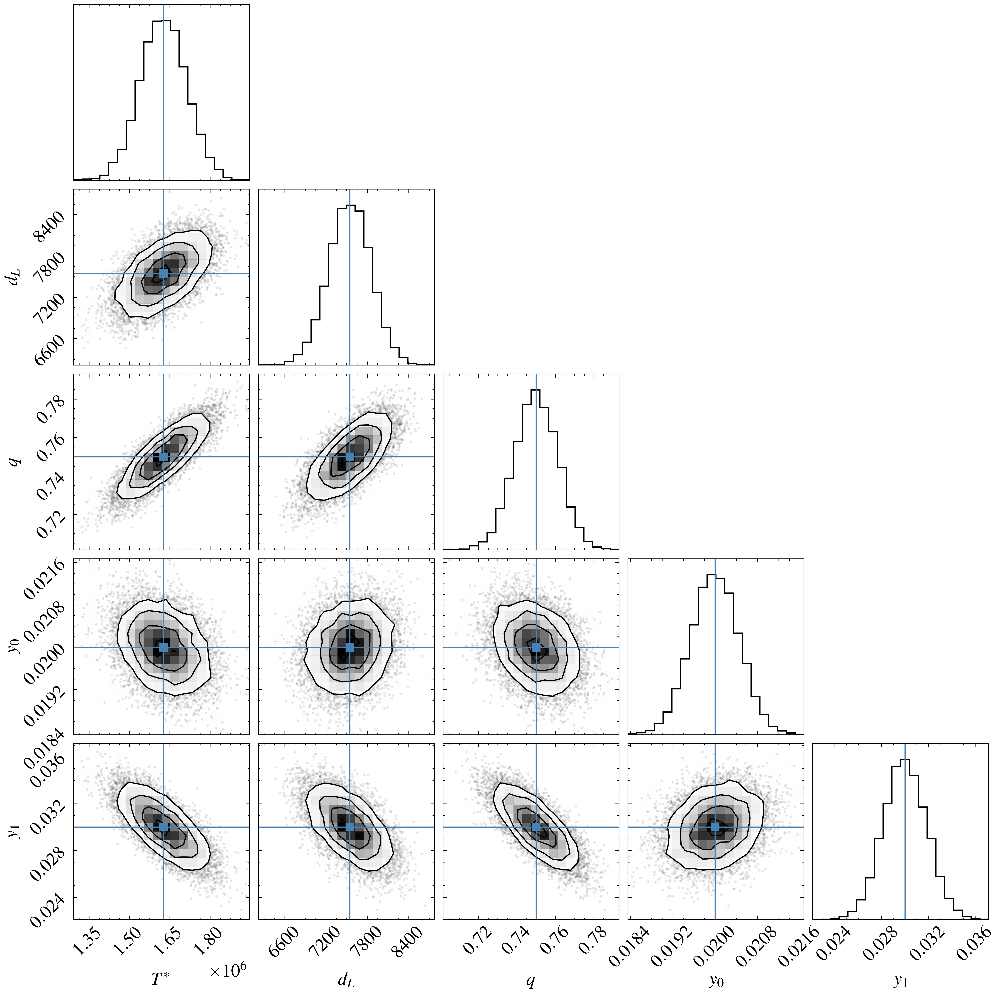

In [4]:
importlib.reload(sien)
# Sample from the posterior
n_samples = 10000
hessian = sien.get_hessian_matrix(Tstar_true, dL_true, q_true, y0true, y1true, 
                          img0_x0_true, img0_x1_true, 
                          img1_x0_true, img1_x1_true, 
                          img2_x0_true, img2_x1_true, 
                          img3_x0_true, img3_x1_true, 
                          lens_mass_model, 0.05, 0.05)
cov = -1*jnp.linalg.inv(hessian)
samples = np.random.multivariate_normal([Tstar_true, dL_true, q_true, y0true, y1true], cov, n_samples)
# Make a corner plot
labels = [r"$T^*$", r"$d_L$", r"$q$", r"$y_0$", r"$y_1$"]
# Make fontsize bigger
import matplotlib
matplotlib.rc('xtick', labelsize=15)
matplotlib.rc('ytick', labelsize=15)
matplotlib.rc('axes', labelsize=15)
matplotlib.rc('axes', titlesize=15)
matplotlib.rc('legend', fontsize=15)
matplotlib.rc('font', size=15)
fig = corner.corner(samples, labels=labels, truths=[Tstar_true, dL_true, q_true, y0true, y1true])
plt.show()

Reproduce Jason et al result (Fig A1):

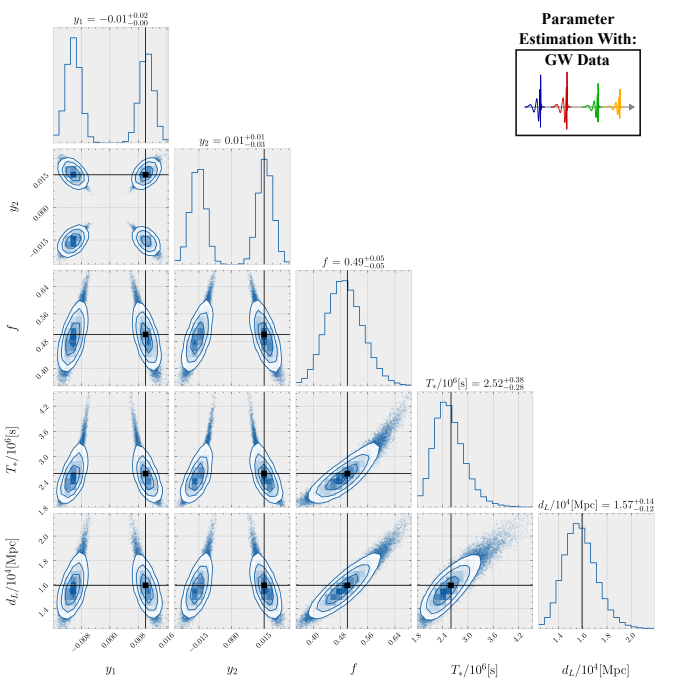

(13, 5) (13, 13)


/tmp/ipykernel_361189/3003934687.py:24: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = np.random.multivariate_normal([Tstar_true, dL_true, q_true, y0true, y1true], cov, n_samples)


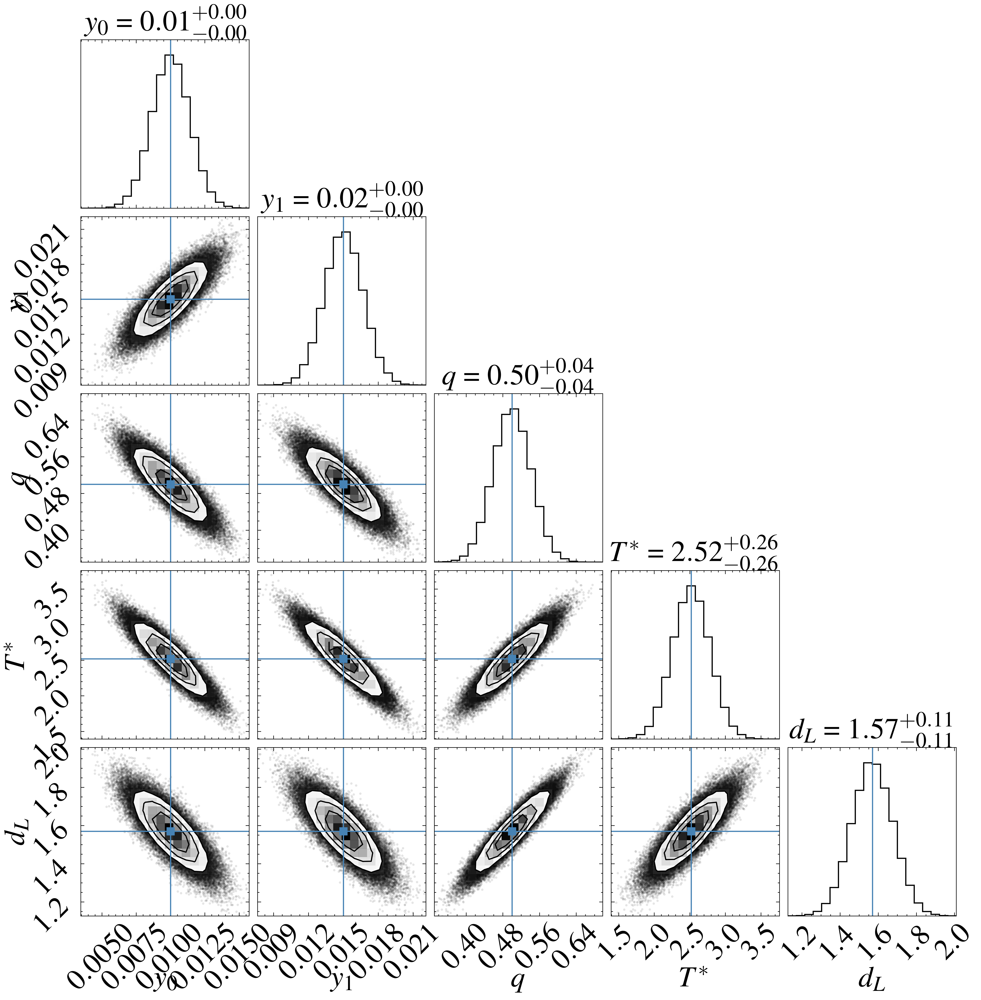

In [6]:
importlib.reload(sien)
# Sample from the posterior
n_samples = 100000
Tstar_true = 2.52e6 # seconds
dL_true = 1.57e4 # Mpc
q_true = 0.5
y0true = 0.01
y1true = 0.015
time_delays_true, dL_effectives_true, \
    img0_x0_true, img0_x1_true, \
    img1_x0_true, img1_x1_true, \
    img2_x0_true, img2_x1_true, \
    img3_x0_true, img3_x1_true \
        = sien.get_true_parameters(Tstar_true, dL_true, q_true, y0true, y1true, lens_mass_model)
cov = jnp.linalg.inv(
    -1.*sien.get_hessian_matrix(Tstar_true, dL_true, q_true, y0true, y1true, 
                          img0_x0_true, img0_x1_true, 
                          img1_x0_true, img1_x1_true, 
                          img2_x0_true, img2_x1_true, 
                          img3_x0_true, img3_x1_true, 
                          lens_mass_model,
                          sigma_td_percent=0.05, sigma_dL_eff_percent=0.05)
)
samples = np.random.multivariate_normal([Tstar_true, dL_true, q_true, y0true, y1true], cov, n_samples)
# Divide out luminosity distance samples by 1e4
samples[:,1] = samples[:,1]/1e4
# Divide out Tstar samples by 1e6
samples[:,0] = samples[:,0]/1e6
# Re-order the variables so that they are in the following order (as in Poon et al): [y0, y1, q, Tstar, dL]
labels = [r"$y_0$", r"$y_1$", r"$q$", r"$T^*$", r"$d_L$"]
idx_reorder = np.array([3, 4, 2, 0, 1]); samples[:,:] = samples[:,idx_reorder]
# Make fontsize bigger
import matplotlib
matplotlib.rc('xtick', labelsize=20)
matplotlib.rc('ytick', labelsize=20)
matplotlib.rc('axes', labelsize=20)
matplotlib.rc('axes', titlesize=20)
matplotlib.rc('legend', fontsize=20)
matplotlib.rc('font', size=20)
fig = corner.corner(samples, labels=labels, truths=[y0true, y1true, q_true, Tstar_true/1e6, dL_true/1e4], show_titles=True)
plt.savefig("fim_result.png", bbox_inches='tight', dpi=200)
plt.show()

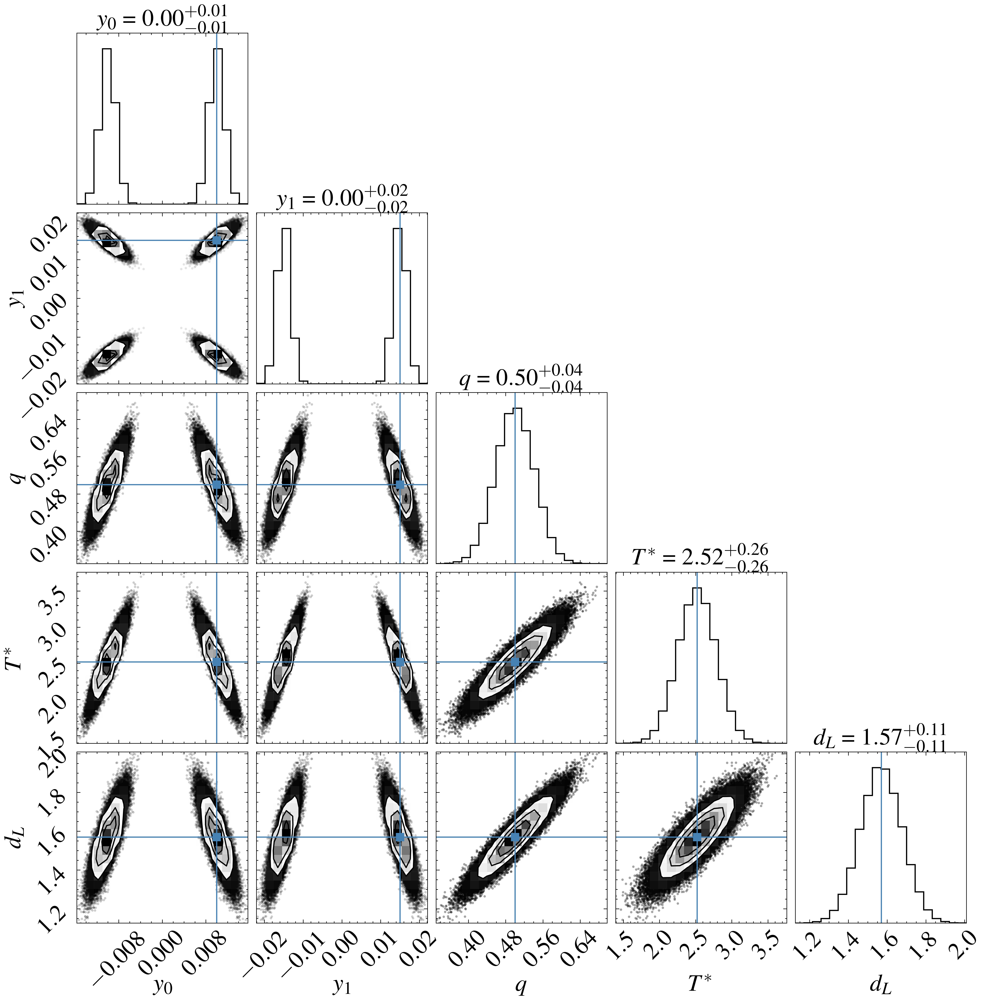

In [7]:
y0_samples = samples[:,0]
y1_samples = samples[:,1]
y_samples = jnp.array([y0_samples, y1_samples])
y_samples2=np.copy(y_samples); y_samples2[0,:] = -y_samples2[0,:]
y_samples3=np.copy(y_samples); y_samples3[1,:] = -y_samples3[1,:]
y_samples4=np.copy(y_samples); y_samples4 = -y_samples
samples1 = np.copy(samples)
samples2 = np.copy(samples); samples2[:,np.array([0,1])] = y_samples2.T
samples3 = np.copy(samples); samples3[:,np.array([0,1])] = y_samples3.T
samples4 = np.copy(samples); samples4[:,np.array([0,1])] = y_samples4.T
samples_all=np.vstack((samples1, samples2, samples3, samples4))
matplotlib.rc('xtick', labelsize=20)
matplotlib.rc('ytick', labelsize=20)
matplotlib.rc('axes', labelsize=20)
matplotlib.rc('axes', titlesize=20)
matplotlib.rc('legend', fontsize=20)
matplotlib.rc('font', size=20)
fig = corner.corner(samples_all, labels=labels, truths=[y0true, y1true, q_true, Tstar_true/1e6, dL_true/1e4], show_titles=True
                    )
plt.show()